# Your First AI application

Going forward, AI algorithms will be incorporated into more and more everyday applications. For example, you might want to include an image classifier in a smart phone app. To do this, you'd use a deep learning model trained on hundreds of thousands of images as part of the overall application architecture. A large part of software development in the future will be using these types of models as common parts of applications.

In this project, you'll train an image classifier to recognize different species of flowers. You can imagine using something like this in a phone app that tells you the name of the flower your camera is looking at. In practice you'd train this classifier, then export it for use in your application. We'll be using [this dataset](http://www.robots.ox.ac.uk/~vgg/data/flowers/102/index.html) from Oxford of 102 flower categories, you can see a few examples below.

<img src='assets/Flowers.png' width=500px>

The project is broken down into multiple steps:

* Load the image dataset and create a pipeline.
* Build and Train an image classifier on this dataset.
* Use your trained model to perform inference on flower images.

We'll lead you through each part which you'll implement in Python.

When you've completed this project, you'll have an application that can be trained on any set of labeled images. Here your network will be learning about flowers and end up as a command line application. But, what you do with your new skills depends on your imagination and effort in building a dataset. For example, imagine an app where you take a picture of a car, it tells you what the make and model is, then looks up information about it. Go build your own dataset and make something new.

## Import Resources

I downgraded tensorflow to 2.14.0 because the curret version 2.18.0 has  dependenciy issues with keras 

In [1]:
!pip install tensorflow==2.14.0  # Downgrade to guarantee Keras 2.x
import tensorflow as tf
keras = tf.keras  # Safe to use now

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 489.9/489.9 MB 3.4 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 49.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 68.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 104.3 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.7/440.7 kB 28.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 6.2 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.17.2
    Uninstalling wrapt-1.17.2:
      Successfully uninstalled wrapt-1.17.2
  Attempting uninstall: keras
    Found existing installation: keras 3.5.0
    Uninstalling keras-3.5.0:
      Successfully uninstalled keras-3.5.0
  Attempting uninstall: google-auth-oauthlib
    Found existing installation: google-auth-oauthlib 1.2.1
    Uninstalling google-auth-oauthlib-1.2.1:
      Successfully uninstalled google-auth-oauthlib-1.2.1
  Att

2025-04-18 04:30:24.254742: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-18 04:30:24.254810: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-18 04:30:24.254851: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [1]:
# TODO: Make all necessary imports.
import os
os.environ['TF_USE_LEGACY_KERAS'] = '1'
import warnings
warnings.filterwarnings('ignore')
import tensorflow_datasets as tfds
tfds.disable_progress_bar()
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
#matplotlib inline
%config InlineBackend.figure_format = 'retina'
import json
import numpy as np
from PIL import Image
from tensorflow.keras.models import load_model
print("TensorFlow version:", tf.__version__)
import logging
logger = tf.get_logger()
logger.setLevel(logging.ERROR)


2025-04-18 07:29:15.465254: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-18 07:29:15.465323: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-18 07:29:15.465366: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


TensorFlow version: 2.14.0


## Load the Dataset

Here you'll use `tensorflow_datasets` to load the [Oxford Flowers 102 dataset](https://www.tensorflow.org/datasets/catalog/oxford_flowers102). This dataset has 3 splits: `'train'`, `'test'`, and `'validation'`.  You'll also need to make sure the training data is normalized and resized to 224x224 pixels as required by the pre-trained networks.

The validation and testing sets are used to measure the model's performance on data it hasn't seen yet, but you'll still need to normalize and resize the images to the appropriate size.

In [3]:
# TODO: Load the dataset with TensorFlow Datasets.
splits = ['test[:80%]', 'test[80%:]', 'train']
#splits =['train', 'test', 'validation']
#splits = ['train[:80%]', 'train[80%:]', 'test']
datasets, dataset_info = tfds.load("oxford_flowers102", split=splits, as_supervised=True, with_info=True)


# TODO: Create a training set, a validation set and a test set.
test_dataset, train_dataset, validation_dataset = datasets


Dataset oxford_flowers102 downloaded and prepared to /root/tensorflow_datasets/oxford_flowers102/2.1.1. Subsequent calls will reuse this data.


In [4]:
dataset_info

tfds.core.DatasetInfo(
    name='oxford_flowers102',
    full_name='oxford_flowers102/2.1.1',
    description="""
    The Oxford Flowers 102 dataset is a consistent of 102 flower categories commonly
    occurring in the United Kingdom. Each class consists of between 40 and 258
    images. The images have large scale, pose and light variations. In addition,
    there are categories that have large variations within the category and several
    very similar categories.
    
    The dataset is divided into a training set, a validation set and a test set. The
    training set and validation set each consist of 10 images per class (totalling
    1020 images each). The test set consists of the remaining 6149 images (minimum
    20 per class).
    
    Note: The dataset by default comes with a test size larger than the train size.
    For more info see this
    [issue](https://github.com/tensorflow/datasets/issues/3022).
    """,
    homepage='https://www.robots.ox.ac.uk/~vgg/data/flowers/102

## Explore the Dataset

In [5]:
# TODO: Get the number of examples in each set from the dataset info.

# TODO: Get the number of classes in the dataset from the dataset info.

# Get the number of examples in each set
num_train_examples = dataset_info.splits["train"].num_examples
num_test_examples = dataset_info.splits["test"].num_examples
num_validation_examples = dataset_info.splits["validation"].num_examples

# Get the number of classes
num_classes = dataset_info.features["label"].num_classes

print(f"Training examples: {num_train_examples:,}")
print(f"Testing examples: {num_test_examples:,}")
print(f"Validation examples: {num_validation_examples:,}")
print(f"Number of classes: {num_classes:,}")


Training examples: 1,020
Testing examples: 6,149
Validation examples: 1,020
Number of classes: 102


In [6]:
# TODO: Print the shape and corresponding label of 3 images in the training set.
print("Oxford Flowers 102 Training Dataset:")

for i, (image, label) in enumerate(train_dataset.take(3), start=1):
    print(f"Example {i}:")
    print('---------------------------------------')
    print(f"\u2022 Image datatype: {image.dtype}")
    print(f"\u2022 Image shape: {image.shape}")
    print(f"\u2022 Label: {label.numpy()}")
    print(f"\u2022 Label datatype: {label.dtype}")
    print('---------------------------------------\n')

Oxford Flowers 102 Training Dataset:
Example 1:
---------------------------------------
• Image datatype: <dtype: 'uint8'>
• Image shape: (519, 500, 3)
• Label: 42
• Label datatype: <dtype: 'int64'>
---------------------------------------

Example 2:
---------------------------------------
• Image datatype: <dtype: 'uint8'>
• Image shape: (500, 763, 3)
• Label: 93
• Label datatype: <dtype: 'int64'>
---------------------------------------

Example 3:
---------------------------------------
• Image datatype: <dtype: 'uint8'>
• Image shape: (500, 700, 3)
• Label: 35
• Label datatype: <dtype: 'int64'>
---------------------------------------



**Notes about the Images shapes**

**Inconsistent Image Shapes** : The images have different shapes: (542, 500, 3), (748, 500, 3), and (500, 600, 3).Thus, resizing may be needed for uniformity in a machine learning pipeline

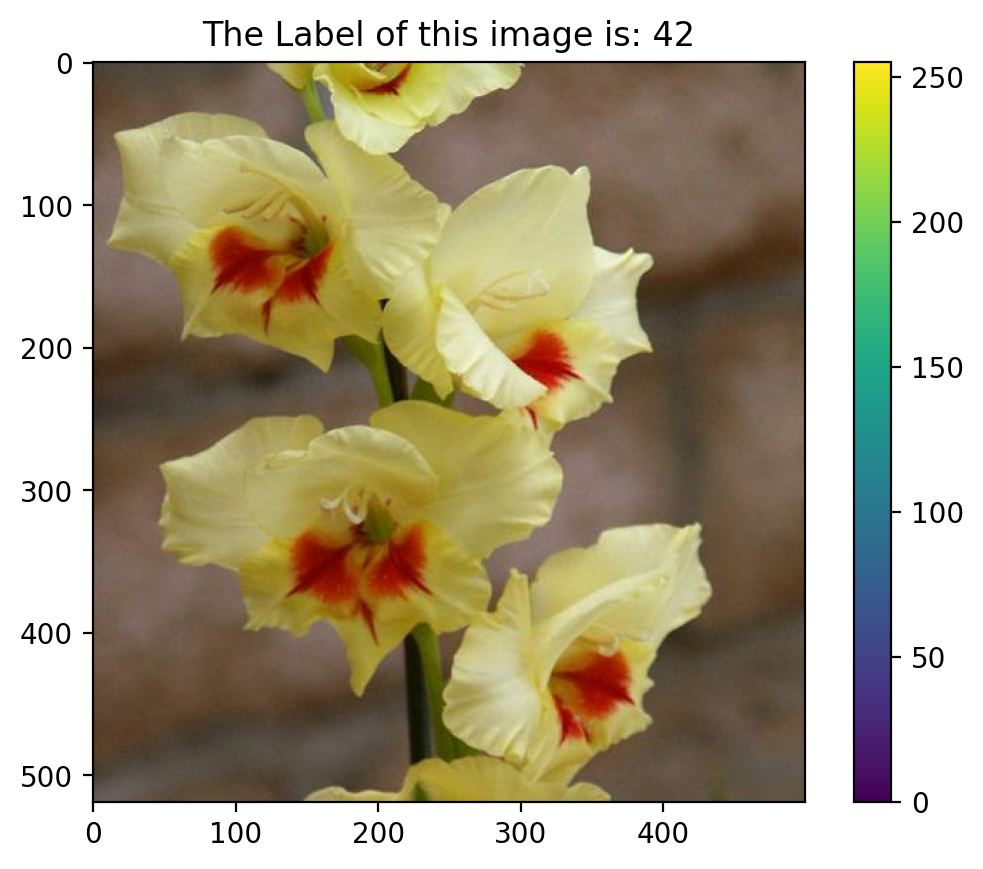

In [7]:
# TODO: Plot 1 image from the training set. Set the title
# of the plot to the corresponding image label.

# Get one image and its label from the training set
for image, label in train_dataset.take(1):
    plt.imshow(image.numpy().squeeze())
    plt.title(f"The Label of this image is: {label.numpy()}")
    plt.colorbar()
    plt.show()


### Label Mapping

You'll also need to load in a mapping from label to category name. You can find this in the file `label_map.json`. It's a JSON object which you can read in with the [`json` module](https://docs.python.org/3.7/library/json.html). This will give you a dictionary mapping the integer coded labels to the actual names of the flowers.

In [14]:
#with open('label_map.json', 'r') as f:
#    class_names = json.load(f)

#class_names

{'0': 'pink primrose',
 '1': 'hard-leaved pocket orchid',
 '2': 'canterbury bells',
 '3': 'sweet pea',
 '4': 'english marigold',
 '5': 'tiger lily',
 '6': 'moon orchid',
 '7': 'bird of paradise',
 '8': 'monkshood',
 '9': 'globe thistle',
 '10': 'snapdragon',
 '11': "colt's foot",
 '12': 'king protea',
 '13': 'spear thistle',
 '14': 'yellow iris',
 '15': 'globe-flower',
 '16': 'purple coneflower',
 '17': 'peruvian lily',
 '18': 'balloon flower',
 '19': 'giant white arum lily',
 '20': 'fire lily',
 '21': 'pincushion flower',
 '22': 'fritillary',
 '23': 'red ginger',
 '24': 'grape hyacinth',
 '25': 'corn poppy',
 '26': 'prince of wales feathers',
 '27': 'stemless gentian',
 '28': 'artichoke',
 '29': 'sweet william',
 '30': 'carnation',
 '31': 'garden phlox',
 '32': 'love in the mist',
 '33': 'mexican aster',
 '34': 'alpine sea holly',
 '35': 'ruby-lipped cattleya',
 '36': 'cape flower',
 '37': 'great masterwort',
 '38': 'siam tulip',
 '39': 'lenten rose',
 '40': 'barbeton daisy',
 '41': '

In [8]:
with open('/kaggle/input/project-image-classifier/label_map.json', 'r') as f:
    class_names = json.load(f)

class_names

{'0': 'pink primrose',
 '1': 'hard-leaved pocket orchid',
 '2': 'canterbury bells',
 '3': 'sweet pea',
 '4': 'english marigold',
 '5': 'tiger lily',
 '6': 'moon orchid',
 '7': 'bird of paradise',
 '8': 'monkshood',
 '9': 'globe thistle',
 '10': 'snapdragon',
 '11': "colt's foot",
 '12': 'king protea',
 '13': 'spear thistle',
 '14': 'yellow iris',
 '15': 'globe-flower',
 '16': 'purple coneflower',
 '17': 'peruvian lily',
 '18': 'balloon flower',
 '19': 'giant white arum lily',
 '20': 'fire lily',
 '21': 'pincushion flower',
 '22': 'fritillary',
 '23': 'red ginger',
 '24': 'grape hyacinth',
 '25': 'corn poppy',
 '26': 'prince of wales feathers',
 '27': 'stemless gentian',
 '28': 'artichoke',
 '29': 'sweet william',
 '30': 'carnation',
 '31': 'garden phlox',
 '32': 'love in the mist',
 '33': 'mexican aster',
 '34': 'alpine sea holly',
 '35': 'ruby-lipped cattleya',
 '36': 'cape flower',
 '37': 'great masterwort',
 '38': 'siam tulip',
 '39': 'lenten rose',
 '40': 'barbeton daisy',
 '41': '

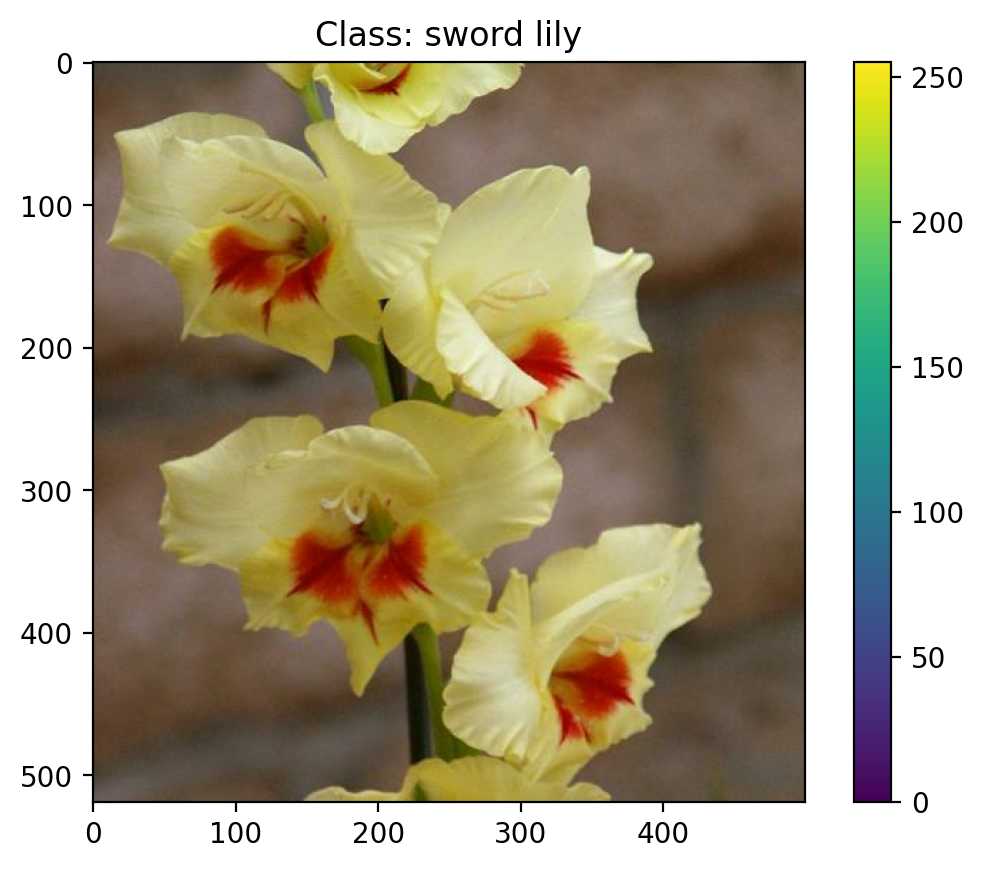

In [9]:
# TODO: Plot 1 image from the training set. Set the title
# of the plot to the corresponding class name.
for image, label in train_dataset.take(1):
    label_index = label.numpy()  # Convert tensor to integer
    class_name = class_names[str(label_index)]  # Get class name from JSON

    # Plot the image
    plt.imshow(image)
    plt.title(f"Class: {class_name}")
    plt.colorbar()
    plt.show()


## Create Pipeline

In [10]:
# Set batch size
BATCH_SIZE = 64

In [11]:
# Define preprocessing function
def preprocess(image, label):
    image = tf.image.resize(image, (224, 224))  # Resize images to 224x224
    image = tf.cast(image, tf.float32) / 255.0  # Normalize pixel values to [0, 1]
    return image, label

In [12]:
# TODO: Create a pipeline for each set.
train_batches = train_dataset.cache().shuffle(num_train_examples//4).map(preprocess).batch(BATCH_SIZE).cache().prefetch(1)
validation_batches = validation_dataset.cache().shuffle(num_validation_examples//4).map(preprocess).batch(BATCH_SIZE).cache().prefetch(1)
testing_batches = test_dataset.cache().shuffle(num_test_examples//4).map(preprocess).batch(BATCH_SIZE).cache().prefetch(1)
print("Pipelines created successfully!")

Pipelines created successfully!


In [13]:
for image_batch, label_batch in train_batches.take(1):
    print("Images in each batch have:")
    print("---------------------------------------")
    print(f"\u2022 Datatype: {image_batch.dtype}")
    print(f"\u2022 Shape: {image_batch.shape}")
    print("---------------------------------------")

    print(f"\nThis batch contains {label_batch.numpy().size} images with corresponding labels:")
    print(label_batch.numpy())
    print("---------------------------------------")

Images in each batch have:
---------------------------------------
• Datatype: <dtype: 'float32'>
• Shape: (64, 224, 224, 3)
---------------------------------------

This batch contains 64 images with corresponding labels:
[82 84 49 73 27 93 27 76 18 90 72 43 98 65 24 72 36 17 86 22 84 51 73 65
 79 87 13 11 80 22 74 91 73 51 12 87 87 17 92 64 92 81 91 59 95 39 54 69
 74 51 64 27 14 73 94 75 88 16 97 59 97 37 55 56]
---------------------------------------


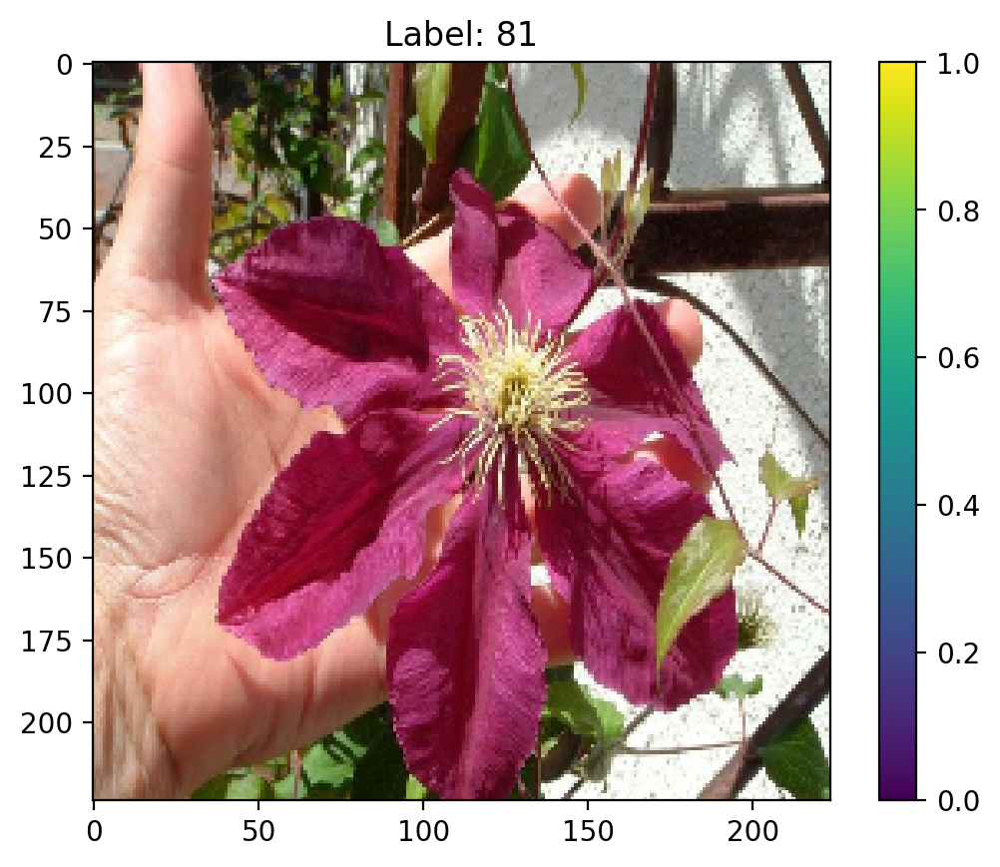

In [14]:
# Take one batch
for image_batch, label_batch in train_batches.take(1):
    images = image_batch.numpy().squeeze()  # Convert to NumPy array
    labels = label_batch.numpy()  # Extract label

    # Plot the first image
    first_image = images[0]
    first_label = labels[0]

    plt.imshow(first_image)
    plt.title(f"Label: {first_label}")
    plt.colorbar()
    plt.show()


# Build and Train the Classifier

Now that the data is ready, it's time to build and train the classifier. You should use the MobileNet pre-trained model from TensorFlow Hub to get the image features. Build and train a new feed-forward classifier using those features.

We're going to leave this part up to you. If you want to talk through it with someone, chat with your fellow students!

Refer to the rubric for guidance on successfully completing this section. Things you'll need to do:

* Load the MobileNet pre-trained network from TensorFlow Hub.
* Define a new, untrained feed-forward network as a classifier.
* Train the classifier.
* Plot the loss and accuracy values achieved during training for the training and validation set.
* Save your trained model as a Keras model.

We've left a cell open for you below, but use as many as you need. Our advice is to break the problem up into smaller parts you can run separately. Check that each part is doing what you expect, then move on to the next. You'll likely find that as you work through each part, you'll need to go back and modify your previous code. This is totally normal!

When training make sure you're updating only the weights of the feed-forward network. You should be able to get the validation accuracy above 70% if you build everything right.

**Note for Workspace users:** One important tip if you're using the workspace to run your code: To avoid having your workspace disconnect during the long-running tasks in this notebook, please read in the earlier page in this lesson called Intro to GPU Workspaces about Keeping Your Session Active. You'll want to include code from the workspace_utils.py module. Also, If your model is over 1 GB when saved as a checkpoint, there might be issues with saving backups in your workspace. If your saved checkpoint is larger than 1 GB (you can open a terminal and check with `ls -lh`), you should reduce the size of your hidden layers and train again.

In [15]:
# URL for MobileNetV2 feature extractor pretrained on ImageNet
mobilenet_v2 ="https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"

# Load MobileNetV2 as a frozen feature extractor
feature_extractor = hub.KerasLayer(
    mobilenet_v2,
    input_shape=(224, 224, 3),
    trainable=False
)

In [16]:
model = tf.keras.Sequential([feature_extractor,
                            tf.keras.layers.Dense(num_classes, activation='softmax')])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              3540265   
                                                                 
 dense (Dense)               (None, 102)               102204    
                                                                 
Total params: 3642469 (13.89 MB)
Trainable params: 102204 (399.23 KB)
Non-trainable params: 3540265 (13.51 MB)
_________________________________________________________________


In [20]:
# Compile the model
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

#add early stopping to prevent overfitting
early_stopping= tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)


model_checkpoint = ModelCheckpoint(
    'best_model.h5',
    monitor='val_loss',
    save_best_only=True,
    mode='min',
    verbose=1  # Shows when model is saved
)

In [22]:
# Set training parameters
EPOCHS = 100

# Train the model
history = model.fit(
    train_batches,
    validation_data=validation_batches,
    epochs=EPOCHS,
    callbacks=[early_stopping, model_checkpoint]
)



print("Model trained and saved successfully!")

Epoch 1/100
20/20 [==============================] - ETA: 0s - loss: 4.0857 - accuracy: 0.1675
Epoch 1: val_loss improved from inf to 3.51735, saving model to best_model.h5
20/20 [==============================] - 52s 2s/step - loss: 4.0857 - accuracy: 0.1675 - val_loss: 3.5173 - val_accuracy: 0.2245
Epoch 2/100
20/20 [==============================] - ETA: 0s - loss: 1.6821 - accuracy: 0.6293
Epoch 2: val_loss improved from 3.51735 to 2.08343, saving model to best_model.h5
20/20 [==============================] - 41s 2s/step - loss: 1.6821 - accuracy: 0.6293 - val_loss: 2.0834 - val_accuracy: 0.5265
Epoch 3/100
20/20 [==============================] - ETA: 0s - loss: 0.8095 - accuracy: 0.8577
Epoch 3: val_loss improved from 2.08343 to 1.58640, saving model to best_model.h5
20/20 [==============================] - 42s 2s/step - loss: 0.8095 - accuracy: 0.8577 - val_loss: 1.5864 - val_accuracy: 0.6461
Epoch 4/100
20/20 [==============================] - ETA: 0s - loss: 0.4805 - accuracy

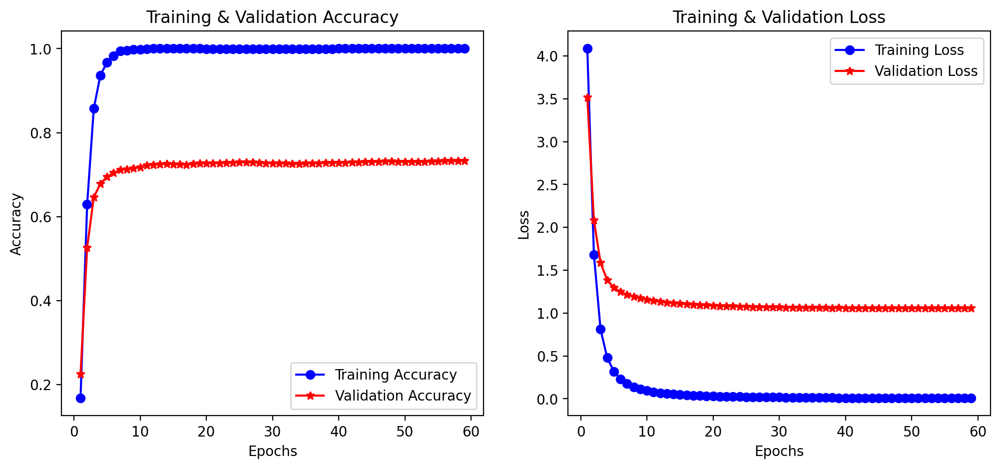

In [23]:
# TODO: Plot the loss and accuracy values achieved during training for the training and validation set.
# Extract loss and accuracy from history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

epochs = range(1, len(train_loss) + 1)

# Plot accuracy
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_acc, 'bo-', label="Training Accuracy")
plt.plot(epochs, val_acc, 'r*-', label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training & Validation Accuracy")
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(epochs, train_loss, 'bo-', label="Training Loss")
plt.plot(epochs, val_loss, 'r*-', label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training & Validation Loss")
plt.legend()

plt.show()


## Save the Model

Now that your network is trained, save the model so you can load it later for making inference. In the cell below save your model as a Keras model (*i.e.* save it as an HDF5 file).

The model is automatically saved using the following code to best_model.h5
```
model_checkpoint = ModelCheckpoint(
    'best_model.h5',
    monitor='val_loss',
    save_best_only=True,
    mode='min',
    verbose=1  # Shows when model is saved
)
```

## Load the Keras Model

Load the Keras model you saved above.

In [2]:
# Force Keras 2.x compatibility
version_fn = getattr(tf.keras, "version", None)
if version_fn and version_fn().startswith("3."):
    from tf_keras.models import load_model  # Use legacy Keras loader
else:
    from tensorflow.keras.models import load_model  # Standard loader

# Load the model
reloaded_model = tf.keras.models.load_model('best_model.h5', custom_objects = {'KerasLayer':hub.KerasLayer})
reloaded_model.summary()

2025-04-18 07:29:43.185542: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:268] failed call to cuInit: UNKNOWN ERROR (34)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              3540265   
                                                                 
 dense (Dense)               (None, 102)               102204    
                                                                 
Total params: 3642469 (13.89 MB)
Trainable params: 102204 (399.23 KB)
Non-trainable params: 3540265 (13.51 MB)
_________________________________________________________________


## Testing your Network

It's good practice to test your trained network on test data, images the network has never seen either in training or validation. This will give you a good estimate for the model's performance on completely new images. You should be able to reach around 70% accuracy on the test set if the model has been trained well.

In [27]:
loss, accuracy = reloaded_model.evaluate(testing_batches)

print("Loss on testing set: ", loss)
print("Accuracy on testing set: ", accuracy)

77/77 [==============================] - 99s 1s/step - loss: 0.8077 - accuracy: 0.7959
Loss on testing set:  0.8077448010444641
Accuracy on testing set:  0.7958934903144836


# Inference for Classification

Now you'll write a function that uses your trained network for inference. Write a function called `predict` that takes an image, a model, and then returns the top $K$ most likely class labels along with the probabilities. The function call should look like:

```python
probs, classes = predict(image_path, model, top_k)
```

If `top_k=5` the output of the `predict` function should be something like this:

```python
probs, classes = predict(image_path, model, 5)
print(probs)
print(classes)
> [ 0.01558163  0.01541934  0.01452626  0.01443549  0.01407339]
> ['70', '3', '45', '62', '55']
```

Your `predict` function should use `PIL` to load the image from the given `image_path`. You can use the [Image.open](https://pillow.readthedocs.io/en/latest/reference/Image.html#PIL.Image.open) function to load the images. The `Image.open()` function returns an `Image` object. You can convert this `Image` object to a NumPy array by using the `np.asarray()` function.

The `predict` function will also need to handle pre-processing the input image such that it can be used by your model. We recommend you write a separate function called `process_image` that performs the pre-processing. You can then call the `process_image` function from the `predict` function.

### Image Pre-processing

The `process_image` function should take in an image (in the form of a NumPy array) and return an image in the form of a NumPy array with shape `(224, 224, 3)`.

First, you should convert your image into a TensorFlow Tensor and then resize it to the appropriate size using `tf.image.resize`.

Second, the pixel values of the input images are typically encoded as integers in the range 0-255, but the model expects the pixel values to be floats in the range 0-1. Therefore, you'll also need to normalize the pixel values.

Finally, convert your image back to a NumPy array using the `.numpy()` method.

In [3]:
# TODO: Create the process_image function

def process_image(image_path):
    image = Image.open(image_path)
    image = np.asarray(image)
    image = tf.image.resize(image, (244,244))
    image = tf.cast(image, tf.float32)
    image /= 255
    return image



To check your `process_image` function we have provided 4 images in the `./test_images/` folder:

* cautleya_spicata.jpg
* hard-leaved_pocket_orchid.jpg
* orange_dahlia.jpg
* wild_pansy.jpg

The code below loads one of the above images using `PIL` and plots the original image alongside the image produced by your `process_image` function. If your `process_image` function works, the plotted image should be the correct size.

I used Kaggle Workspace to train this model because I encountered persistent disconnection issues with the Udacity workspace. Despite reaching out to both Udacity support and my session lead, neither provided a viable solution. As a result, I explored alternative platforms and chose Kaggle for stability.

In [29]:
test_images = "/kaggle/input/project-image-classifier"  # Path to the test images

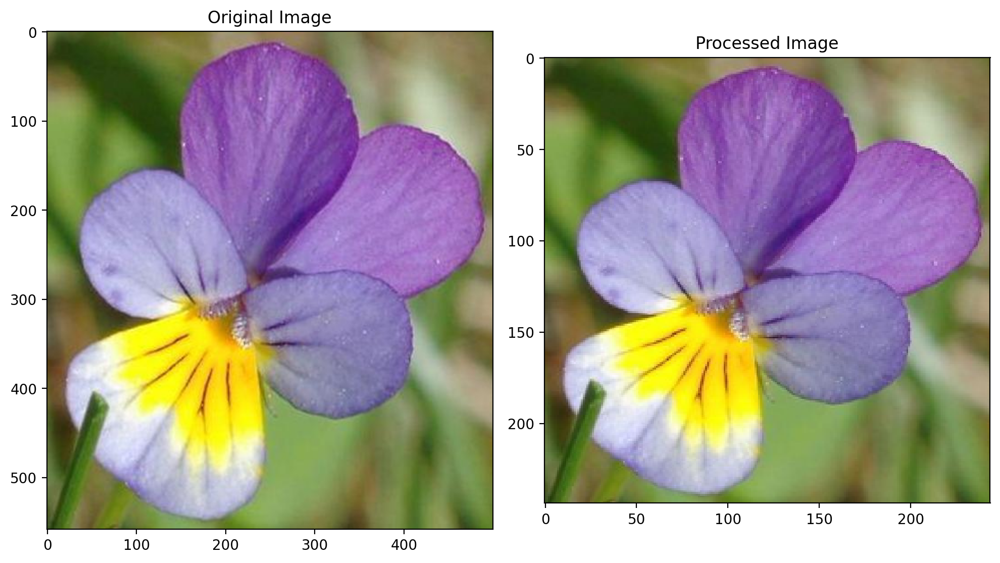

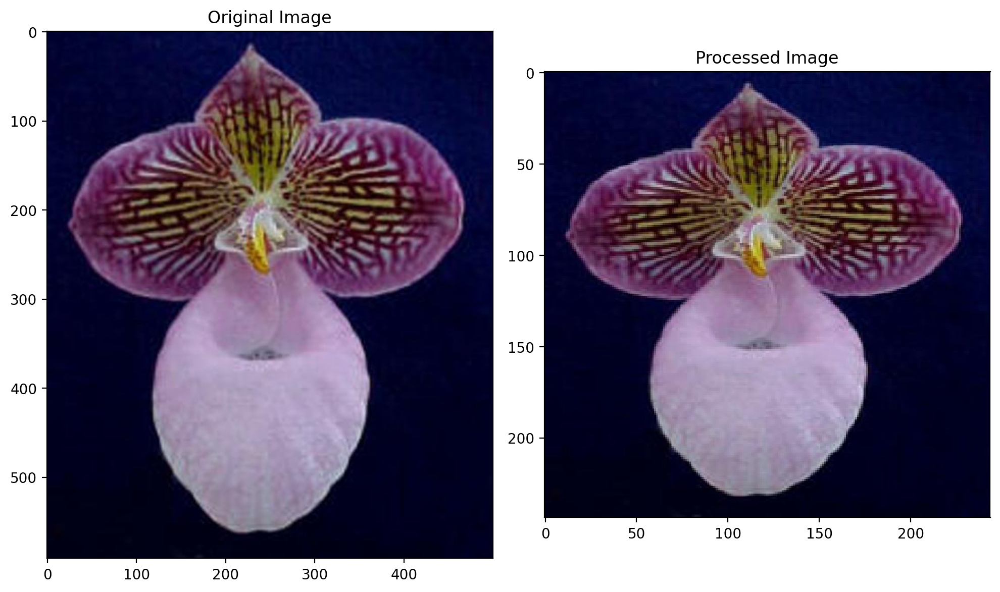

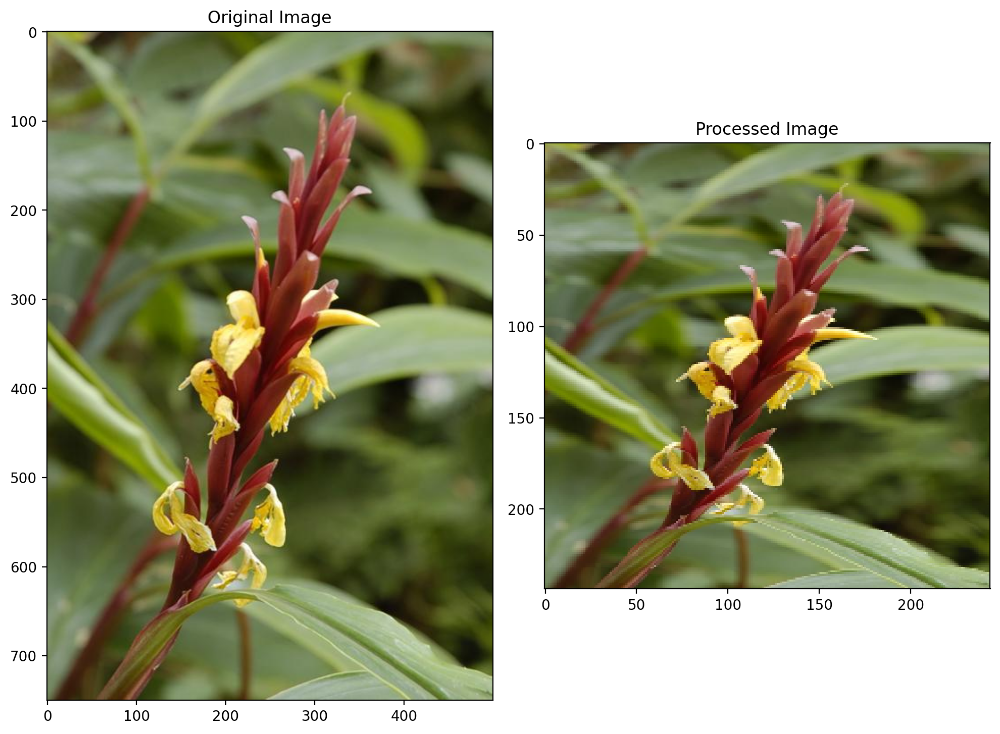

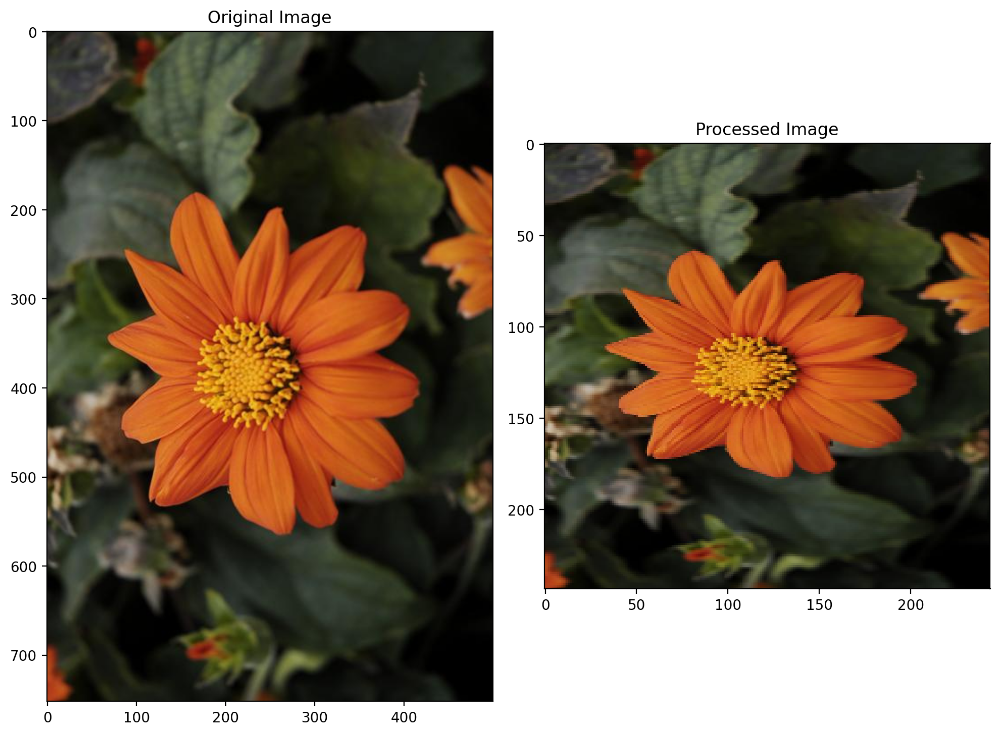

In [30]:
# Loop through the files in the directory and process only .jpg files
for test_image_path in os.listdir(test_images):
    # Check if the file is a .jpg file
    if test_image_path.endswith('.jpg'):
        fig, (ax1, ax2) = plt.subplots(figsize=(10,10), ncols=2)
        
        # Open and display the original image
        test_image = Image.open(os.path.join(test_images, test_image_path))
        test_image = np.asarray(test_image)
        ax1.imshow(test_image)
        ax1.set_title('Original Image')

        # Process the test image (you would have a process_image function)
        processed_test_image = process_image(os.path.join(test_images, test_image_path))
        ax2.imshow(processed_test_image)
        ax2.set_title('Processed Image')

        plt.tight_layout()
        plt.show()

Once you can get images in the correct format, it's time to write the `predict` function for making inference with your model.

### Inference

Remember, the `predict` function should take an image, a model, and then returns the top $K$ most likely class labels along with the probabilities. The function call should look like:

```python
probs, classes = predict(image_path, model, top_k)
```

If `top_k=5` the output of the `predict` function should be something like this:

```python
probs, classes = predict(image_path, model, 5)
print(probs)
print(classes)
> [ 0.01558163  0.01541934  0.01452626  0.01443549  0.01407339]
> ['70', '3', '45', '62', '55']
```

Your `predict` function should use `PIL` to load the image from the given `image_path`. You can use the [Image.open](https://pillow.readthedocs.io/en/latest/reference/Image.html#PIL.Image.open) function to load the images. The `Image.open()` function returns an `Image` object. You can convert this `Image` object to a NumPy array by using the `np.asarray()` function.

**Note:** The image returned by the `process_image` function is a NumPy array with shape `(224, 224, 3)` but the model expects the input images to be of shape `(1, 224, 224, 3)`. This extra dimension represents the batch size. We suggest you use the `np.expand_dims()` function to add the extra dimension.

# Sanity Check

It's always good to check the predictions made by your model to make sure they are correct. To check your predictions we have provided 4 images in the `./test_images/` folder:

* cautleya_spicata.jpg
* hard-leaved_pocket_orchid.jpg
* orange_dahlia.jpg
* wild_pansy.jpg

In the cell below use `matplotlib` to plot the input image alongside the probabilities for the top 5 classes predicted by your model. Plot the probabilities as a bar graph. The plot should look like this:

<img src='assets/inference_example.png' width=600px>

You can convert from the class integer labels to actual flower names using `class_names`.

In [16]:
#test_images='test_images'

In [7]:
def process_image(image_path):
    image = Image.open(image_path)
    image = np.asarray(image)
    image = tf.image.resize(image, (224, 224))  
    image = tf.cast(image, tf.float32)
    image /= 255
    return image

In [8]:
def predict(image_path, model, top_k=5):
    processed_img = process_image(image_path)
    # Add batch dimension
    processed_img = np.expand_dims(processed_img, axis=0)
    
    prob_pred = model.predict(processed_img)
    probs, classes = tf.math.top_k(prob_pred, k=top_k)
    
    probs = probs.numpy().tolist()[0]
    classes = classes.numpy().tolist()[0]
    return probs, classes

In [9]:
# Loop through the files in the directory and process only .jpg files
for test_image_path in os.listdir(test_images):
    if test_image_path.lower().endswith('.jpg'):  # Check if file is a .jpg (case insensitive)
        full_path = os.path.join(test_images, test_image_path)
        print(full_path)
        probs, classes = predict(full_path, reloaded_model, 5)
        print(probs, classes)

test_images/cautleya_spicata.jpg
1/1 [==============================] - 0s 472ms/step
[0.995582640171051, 0.0007080113282427192, 0.0006947956862859428, 0.0005628669168800116, 0.00021319069492165] [60, 17, 23, 72, 14]
test_images/orange_dahlia.jpg
1/1 [==============================] - 0s 153ms/step
[0.9902433753013611, 0.004151088185608387, 0.0017485009739175439, 0.0013808460207656026, 0.0005885145510546863] [58, 4, 65, 40, 99]
test_images/wild_pansy.jpg
1/1 [==============================] - 0s 78ms/step
[0.9993693232536316, 0.0001576405338710174, 0.0001234916999237612, 9.114976273849607e-05, 4.960298974765465e-05] [51, 47, 65, 64, 80]
test_images/hard-leaved_pocket_orchid.jpg
1/1 [==============================] - 0s 159ms/step
[0.9980308413505554, 0.0007707187905907631, 0.0001885326491901651, 0.00015477377746719867, 0.00013757504348177463] [1, 76, 79, 90, 6]


In [17]:
def plot_prop(test_image_path, processed_image, top_k_class_names, top_k_probs):
    """
    Plots the input image alongside its predicted class probabilities.
    
    Args:
        test_image_path (str): Path to the original image file
        processed_image (array): Processed image array (after resizing/normalization)
        top_k_class_names (list): List of top K class names
        top_k_probs (list): List of corresponding probabilities
    """
    fig, (ax1, ax2) = plt.subplots(figsize=(12, 6), ncols=2)
    
    # Plot image
    ax1.imshow(processed_image)
    ax1.axis('off')
    # Format title by removing file extension and underscores
    title = os.path.basename(test_image_path).replace('_', ' ').replace(".jpg", "")
    ax1.set_title(title, fontsize=12, pad=10)
    
    # Plot probabilities
    ax2.barh(np.arange(len(top_k_probs)), top_k_probs, color='skyblue')
    ax2.set_aspect(0.1)
    ax2.set_yticks(np.arange(len(top_k_probs)))
    ax2.set_yticklabels(top_k_class_names, size=10)
    
    # Add probability text on bars
    for i, prob in enumerate(top_k_probs):
        ax2.text(prob + 0.02, i, f"{prob:.2f}", va='center', fontsize=10)
    
    ax2.set_title('Class Probabilities', fontsize=12, pad=10)
    ax2.set_xlim(0, 1.1)
    ax2.grid(axis='x', linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.show()

1/1 [==============================] - 0s 74ms/step


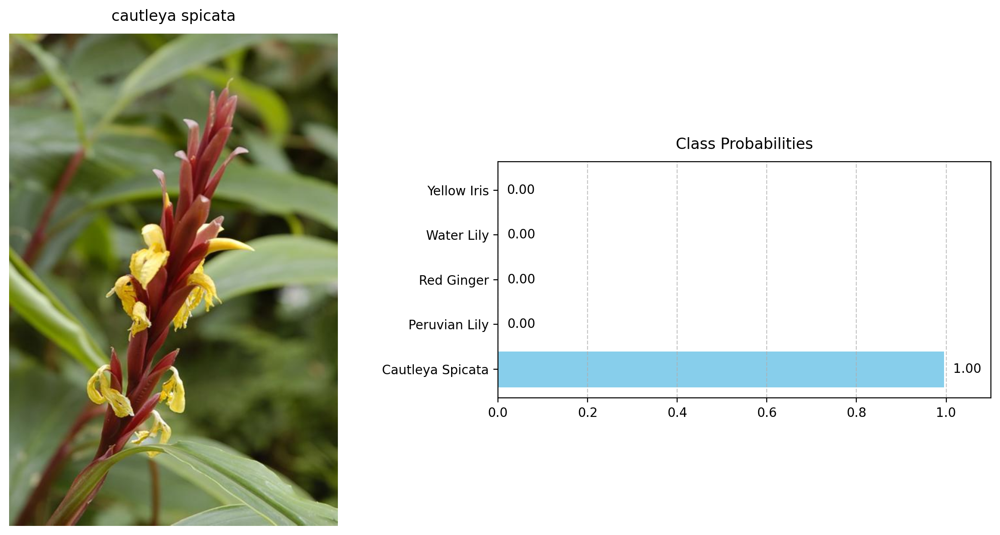

1/1 [==============================] - 0s 43ms/step


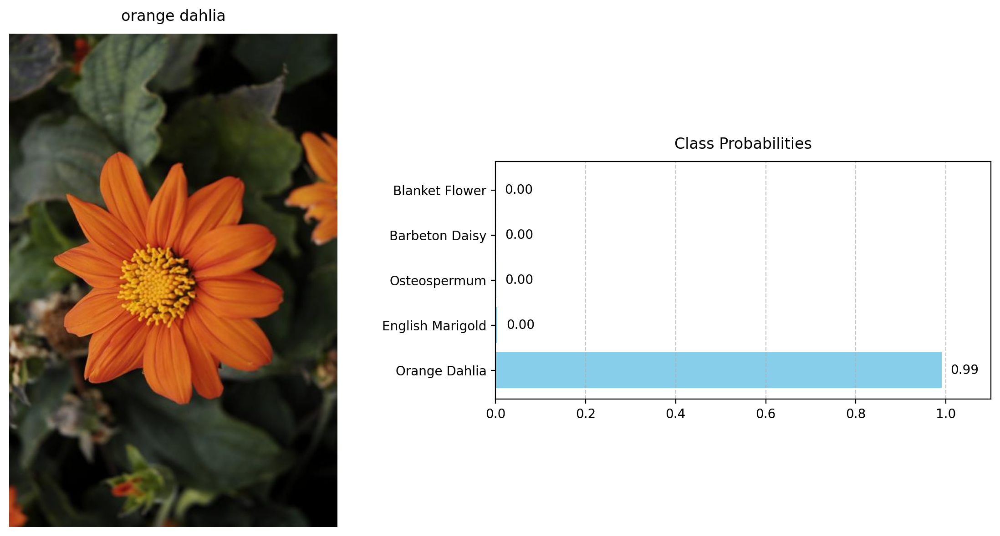

1/1 [==============================] - 0s 59ms/step


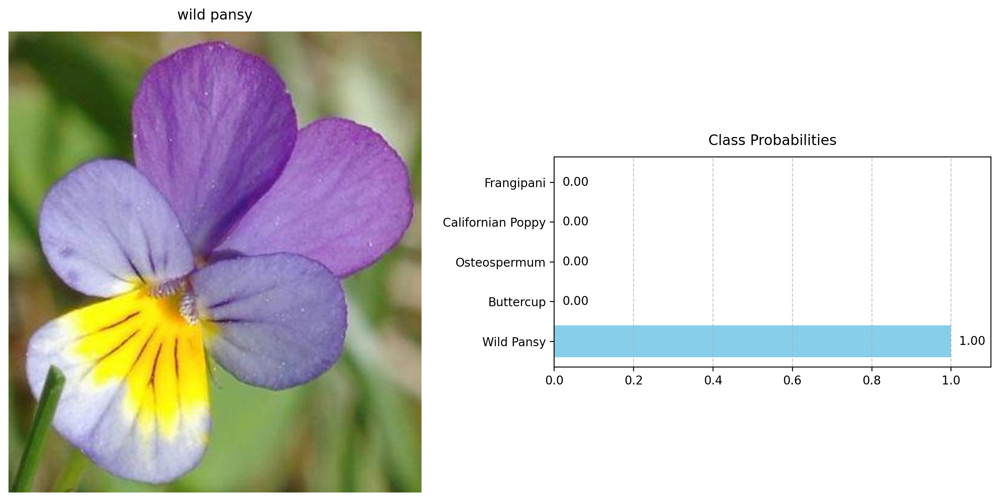

1/1 [==============================] - 0s 61ms/step


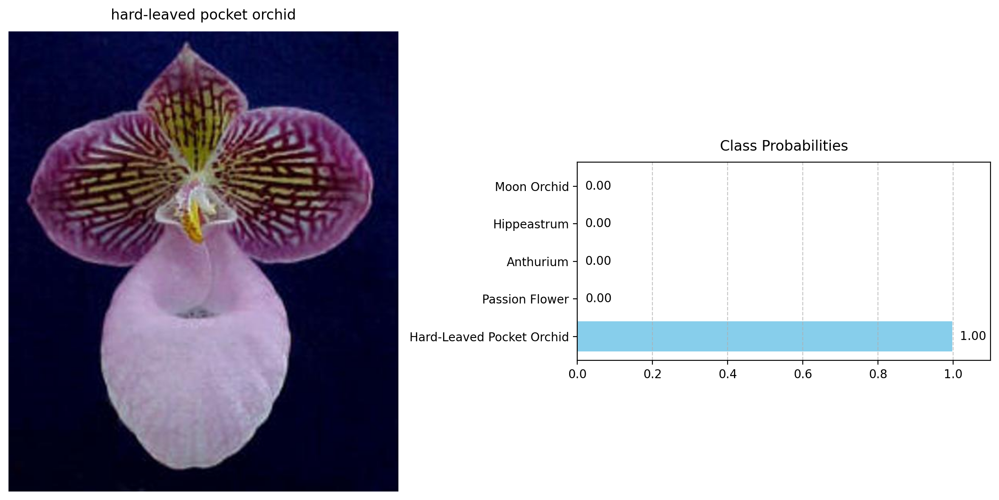

In [21]:
for test_image_path in os.listdir(test_images):
    # Only process .jpg files (case insensitive)
    if not test_image_path.lower().endswith('.jpg'):
        continue
    
    try:
        # Open and process the image
        test_image = Image.open(os.path.join(test_images, test_image_path))
        
        # Get predictions (only 2 values)
        top_k_probs, top_k_classes = predict(
            os.path.join(test_images, test_image_path), 
            reloaded_model, 
            5
        )
        
        # Map class indices to names
        top_k_class_names = [class_names[str(label)].title() for label in top_k_classes]
        
        # Plot the results (using the original image instead of processed_image)
        plot_prop(test_image_path, np.array(test_image), top_k_class_names, top_k_probs)
        
    except Exception as e:
        print(f"Error processing {test_image_path}: {str(e)}")
        continue

1/1 [==============================] - 0s 60ms/step


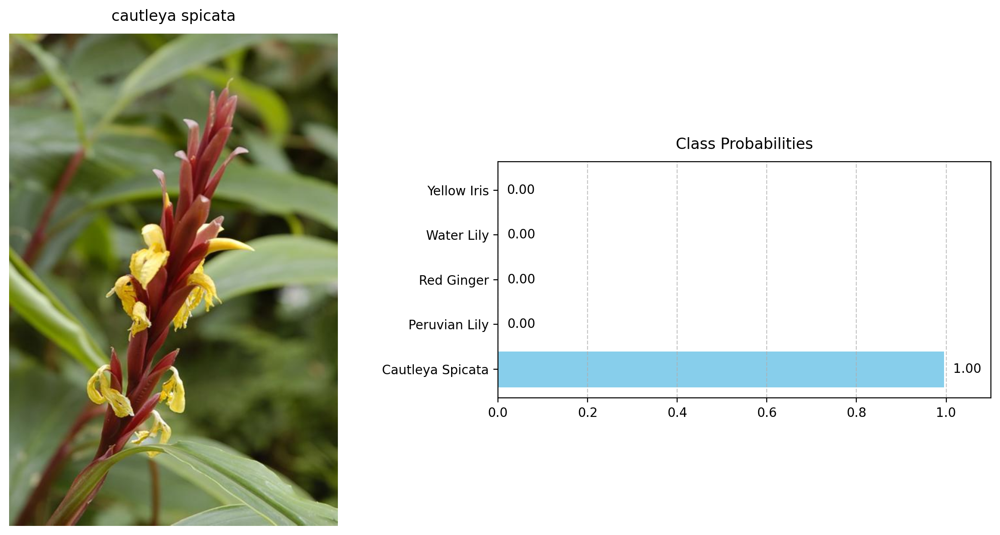

1/1 [==============================] - 0s 86ms/step


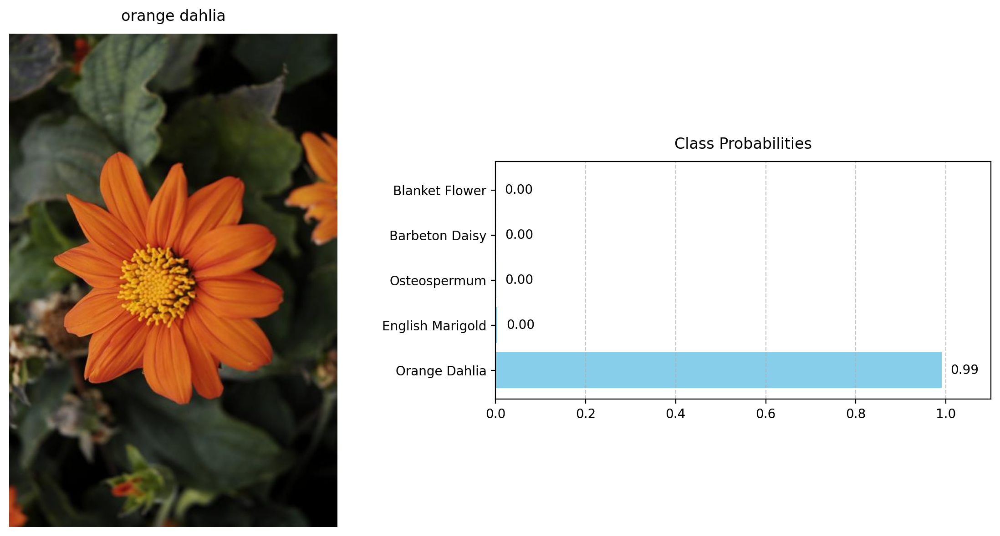

1/1 [==============================] - 0s 54ms/step


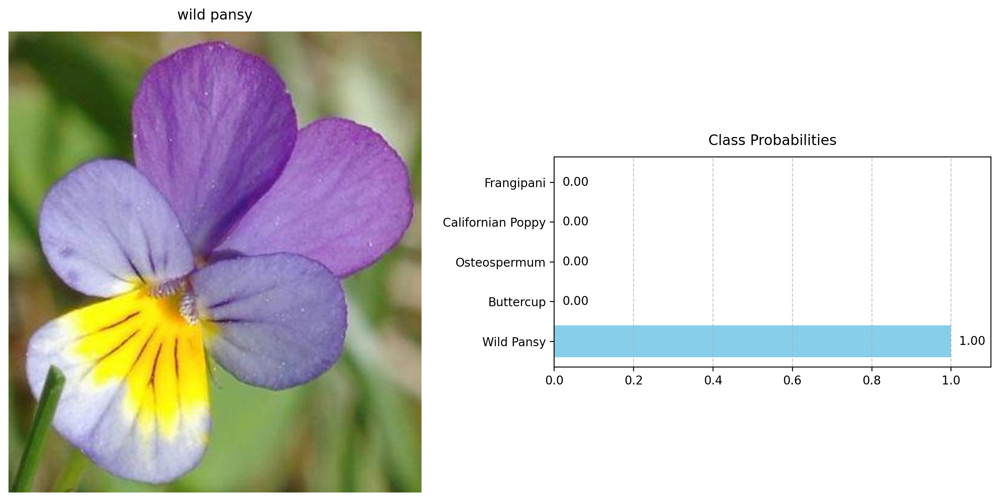

1/1 [==============================] - 0s 52ms/step


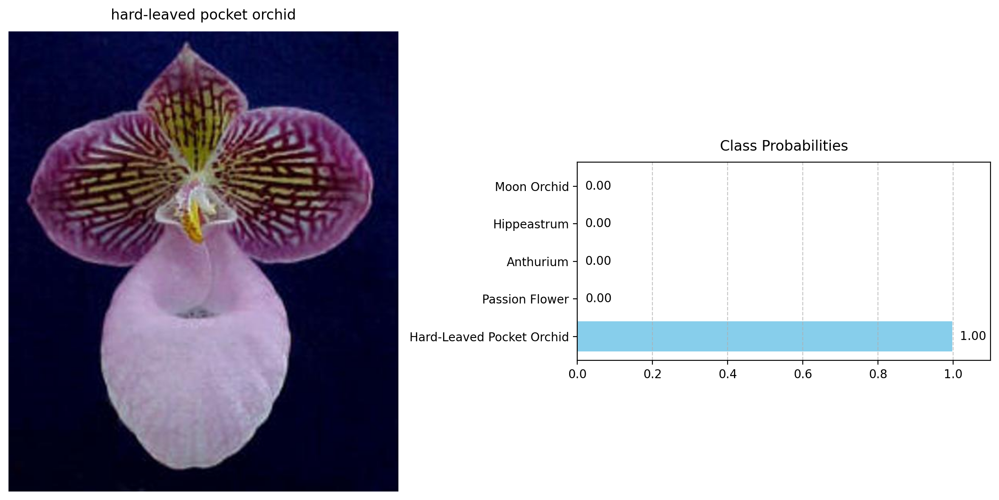

In [19]:
for test_image_path in os.listdir(test_images):
    if not test_image_path.lower().endswith(('.jpg', '.jpeg', '.png')):
        continue
    
    full_path = os.path.join(test_images, test_image_path)
    
    try:
        # Get predictions (only 2 values)
        top_k_probs, top_k_classes = predict(full_path, reloaded_model, 5)
        
        # Load original image for display
        display_image = Image.open(full_path)
        display_image = np.array(display_image)
        
        # Map class indices to names
        top_k_class_names = [class_names[str(cls)].title() for cls in top_k_classes]
        
        plot_prop(test_image_path, display_image, top_k_class_names, top_k_probs)
        
    except Exception as e:
        print(f"Error processing {test_image_path}: {str(e)}")
        continue

## Part two - Test predict.py

In [20]:
!python predict.py --input "test_images/wild_pansy.jpg" --top_k 5

2025-04-18 07:34:44.388307: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-18 07:34:44.388365: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-18 07:34:44.388430: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
Starting Prediction...
2025-04-18 07:34:46.861148: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:268] failed call to cuInit: UNKNOWN ERROR (34)
1/1 [==============================] - 0s 385ms/step

Results:
Image: test_images/wild_pansy.jpg
• wild pansy: 99.94%
---------------------------
• buttercup: 0.02%
---------------------------
• osteosp

## Save as HTML

In [22]:

# Convert the current notebook to HTML
!jupyter nbconvert --to html project-image-classifier-project-two.ipynb

[NbConvertApp] Converting notebook project-image-classifier-project-two.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 18 image(s).
[NbConvertApp] Writing 18363710 bytes to project-image-classifier-project-two.html
